In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("Bias_correction.csv")
pd.set_option("display.max_columns",None)
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,6/30/2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,6/30/2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,6/30/2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,6/30/2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,6/30/2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [3]:
df.shape

(7752, 25)

In [4]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [6]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

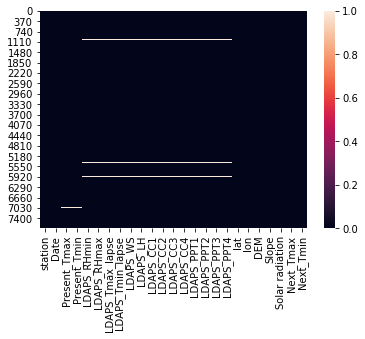

In [7]:
sns.heatmap(df.isnull())

In [8]:
df['Date']=pd.to_datetime(df['Date'])

In [9]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

In [10]:
# changing date colummn type into datetime 
df["Day"]=df['Date'].dt.day
df["Month"]=df['Date'].dt.month
df["year"]=df['Date'].dt.year
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,year
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30.0,6.0,2013.0
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30.0,6.0,2013.0
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30.0,6.0,2013.0
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30.0,6.0,2013.0
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30.0,6.0,2013.0


In [11]:
df.drop("Date",axis=1,inplace=True)

In [12]:
#Checking the unique values and their count
for i in df.columns:
    print(df[i].value_counts())
    print()

25.0    310
12.0    310
2.0     310
3.0     310
4.0     310
5.0     310
6.0     310
7.0     310
8.0     310
9.0     310
10.0    310
11.0    310
13.0    310
23.0    310
14.0    310
15.0    310
16.0    310
18.0    310
20.0    310
22.0    310
24.0    310
17.0    310
19.0    310
21.0    310
1.0     310
Name: station, dtype: int64

31.4    112
29.4    111
29.1    108
29.7    107
30.6    105
       ... 
36.4      1
20.7      1
20.4      1
20.3      1
21.2      1
Name: Present_Tmax, Length: 167, dtype: int64

24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
13.5      1
15.0      1
13.6      1
14.2      1
29.6      1
Name: Present_Tmin, Length: 155, dtype: int64

51.810596    2
71.658089    2
77.030350    2
98.524734    2
19.794666    2
            ..
44.005089    1
58.655628    1
58.761993    1
42.186558    1
71.359451    1
Name: LDAPS_RHmin, Length: 7672, dtype: int64

58.936283    2
96.525200    2
91.776146    2
88.876610    2
92.531029    2
            ..
83.450928  

In [13]:
col=['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']
df['Present_Tmax'].fillna(df['Present_Tmax'].mean(),inplace=True)
df['Present_Tmin'].fillna(df['Present_Tmin'].mean(),inplace=True)
df['LDAPS_RHmin'].fillna(df['LDAPS_RHmin'].mean(),inplace=True)
df['LDAPS_RHmax'].fillna(df['LDAPS_RHmax'].mean(),inplace=True)
df['LDAPS_Tmax_lapse'].fillna(df['LDAPS_Tmax_lapse'].mean(),inplace=True)
df['LDAPS_Tmin_lapse'].fillna(df['LDAPS_Tmin_lapse'].mean(),inplace=True)
df['LDAPS_WS'].fillna(df['LDAPS_WS'].mean(),inplace=True)
df['LDAPS_LH'].fillna(df['LDAPS_LH'].mean(),inplace=True)
df['LDAPS_CC1'].fillna(df['LDAPS_CC1'].mean(),inplace=True)
df['LDAPS_CC2'].fillna(df['LDAPS_CC2'].mean(),inplace=True)
df['LDAPS_CC3'].fillna(df['LDAPS_CC3'].mean(),inplace=True)
df['LDAPS_CC4'].fillna(df['LDAPS_CC4'].mean(),inplace=True)
df['LDAPS_PPT1'].fillna(df['LDAPS_PPT1'].mean(),inplace=True)
df['LDAPS_PPT2'].fillna(df['LDAPS_PPT2'].mean(),inplace=True)
df['LDAPS_PPT3'].fillna(df['LDAPS_PPT3'].mean(),inplace=True)
df['LDAPS_PPT4'].fillna(df['LDAPS_PPT4'].mean(),inplace=True)
df['Next_Tmax'].fillna(df['Next_Tmax'].mean(),inplace=True)
df['Next_Tmin'].fillna(df['Next_Tmin'].mean(),inplace=True)


In [14]:
df.isnull().sum()

station             2
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 2
Month               2
year                2
dtype: int64

In [15]:
df.dropna(inplace=True)

In [16]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
year                0
dtype: int64

In [17]:
df.shape

(7750, 27)

In [18]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,year
count,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000
mean,13.000000,29.768461,23.225736,56.758753,88.377102,29.613841,23.512993,7.096514,62.495367,0.368744,0.356047,0.318359,0.299143,0.589089,0.482338,0.276227,0.267328,37.544720,126.991400,61.854944,1.256692,5341.549330,30.275435,22.932835,15.983871,7.467742,2015.000000
std,7.211568,2.953516,2.398327,14.585101,7.149011,2.928357,2.330881,2.166519,33.516382,0.261096,0.256717,0.249039,0.253007,1.918691,1.737965,1.142722,1.185994,0.050335,0.079406,54.256953,1.369833,428.996445,3.117994,2.478851,8.918647,0.530334,1.414305
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098500,4329.520508,17.400000,11.300000,1.000000,6.000000,2013.000000
25%,7.000000,27.800000,21.700000,46.048225,84.318649,27.693733,22.115268,5.686498,37.547426,0.148339,0.142424,0.103113,0.082777,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000,8.000000,7.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.313244,89.699505,29.662273,23.735942,6.563068,57.310630,0.320110,0.315667,0.265264,0.232354,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,16.000000,7.000000,2015.000000
75%,19.000000,32.000000,24.875000,67.032715,93.703491,31.682567,25.133460,8.005363,83.891182,0.571665,0.554910,0.493971,0.497218,0.067515,0.024224,0.009685,0.000686,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,24.000000,8.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178200,5992.895996,38.900000,29.800000,31.000000,8.000000,2017.000000


In [19]:
df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,year
station,1.000000e+00,0.112786,0.131922,-0.066796,-0.167196,0.069223,0.104911,0.005294,-0.133575,0.006922,0.003398,0.000694,0.006129,-0.002735,-0.008328,-0.012609,-0.010529,-2.376097e-01,-1.187626e-01,-2.559703e-01,-9.011266e-02,-0.019011,0.108155,0.128539,-2.760077e-17,-6.892924e-19,0.000000e+00
Present_Tmax,1.127860e-01,1.000000,0.617699,-0.207063,-0.304833,0.568958,0.622538,-0.125517,0.133333,-0.313699,-0.215552,-0.145727,-0.142388,-0.114403,-0.104792,-0.126706,-0.105768,-5.413219e-02,7.526809e-03,-1.887788e-01,-1.073332e-01,-0.027008,0.609320,0.621706,-1.420178e-01,1.461215e-01,5.986937e-02
Present_Tmin,1.319217e-01,0.617699,1.000000,0.120862,-0.018417,0.462182,0.762218,-0.038555,-0.012366,0.082934,0.088750,-0.004560,-0.046170,0.109612,0.064422,-0.051820,-0.068977,-8.051933e-02,-4.555963e-02,-2.525178e-01,-1.483003e-01,0.051659,0.469904,0.795860,-1.063255e-01,8.749783e-02,3.747394e-02
LDAPS_RHmin,-6.679610e-02,-0.207063,0.120862,1.000000,0.578472,-0.568528,0.087426,0.292438,-0.073447,0.613375,0.745177,0.689315,0.513469,0.260812,0.390469,0.238624,0.165641,8.590934e-02,-7.769602e-02,1.009442e-01,1.225974e-01,0.243102,-0.441382,0.092732,-6.319552e-02,-1.891832e-01,-2.046436e-03
LDAPS_RHmax,-1.671955e-01,-0.304833,-0.018417,0.578472,1.000000,-0.377319,-0.117110,0.133479,0.237121,0.436177,0.390779,0.226132,0.129667,0.268603,0.228819,0.133394,0.116427,1.947819e-01,2.422561e-02,1.764229e-01,2.189528e-01,0.147954,-0.287324,-0.075301,-1.506920e-02,-1.179583e-01,-1.420113e-01
LDAPS_Tmax_lapse,6.922327e-02,0.568958,0.462182,-0.568528,-0.377319,1.000000,0.652948,-0.317239,0.045198,-0.441029,-0.526428,-0.544270,-0.432172,-0.117191,-0.249766,-0.196162,-0.168065,-4.389584e-02,8.905060e-02,-1.808676e-01,-1.642717e-01,0.046232,0.826628,0.585410,-1.596456e-01,9.750545e-02,1.619933e-02
LDAPS_Tmin_lapse,1.049107e-01,0.622538,0.762218,0.087426,-0.117110,0.652948,1.000000,-0.133944,-0.137862,0.009424,0.046304,-0.045665,-0.082003,0.034237,-0.003375,-0.094489,-0.100741,-9.801410e-02,-2.843003e-02,-1.972517e-01,-1.876267e-01,0.158569,0.585726,0.879808,-1.729830e-01,2.342232e-02,-4.700245e-03
LDAPS_WS,5.294066e-03,-0.125517,-0.038555,0.292438,0.133479,-0.317239,-0.133944,1.000000,0.002215,0.288147,0.259618,0.241245,0.218724,0.143840,0.183573,0.152102,0.134116,3.459925e-02,-6.180064e-02,1.891089e-01,1.695535e-01,0.120288,-0.347854,-0.100688,-4.081957e-02,-1.119474e-01,-1.117178e-01
LDAPS_LH,-1.335752e-01,0.133333,-0.012366,-0.073447,0.237121,0.045198,-0.137862,0.002215,1.000000,-0.149353,-0.266636,-0.248052,-0.175042,-0.019768,-0.085559,0.008335,0.012161,1.318271e-01,2.421591e-02,5.337541e-02,8.506192e-02,-0.049060,0.155309,-0.058622,-2.083746e-02,6.599551e-02,5.717091e-02
LDAPS_CC1,6.922023e-03,-0.313699,0.082934,0.613375,0.436177,-0.441029,0.009424,0.288147,-0.149353,1.000000,0.779472,0.517004,0.360408,0.447081,0.389690,0.166757,0.088760,-9.048002e-03,-7.764004e-03,-1.509135e-02,-2.177460e-02,0.217643,-0.455045,-0.012729,-2.530698e-02,-2.095562e-01,-6.650906e-02


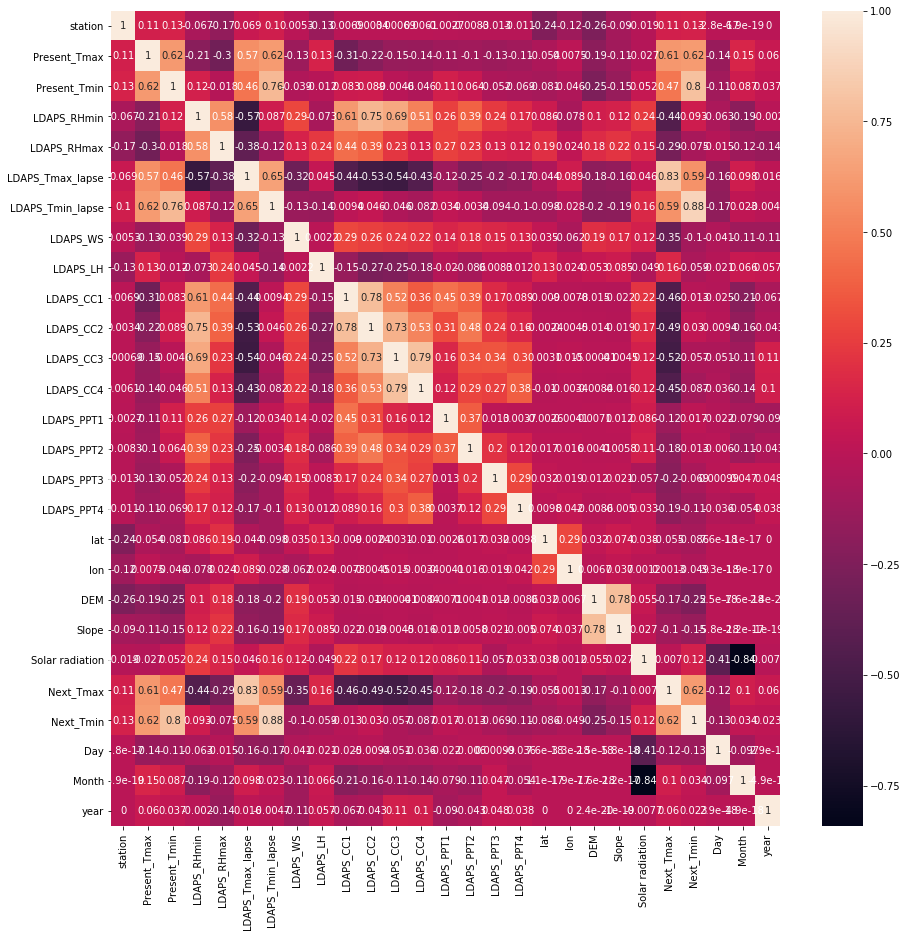

In [20]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True)
plt.show()

<Figure size 720x576 with 0 Axes>

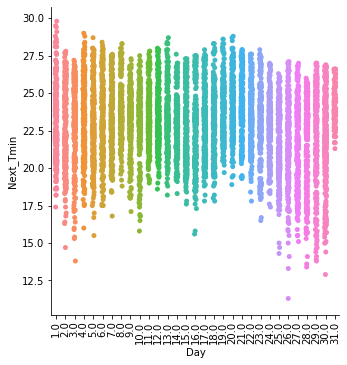

In [21]:
plt.figure(figsize=(10,8))
sns.catplot(x="Day",y='Next_Tmin',data=df)
plt.xticks(rotation=90)
plt.show()

<Figure size 864x576 with 0 Axes>

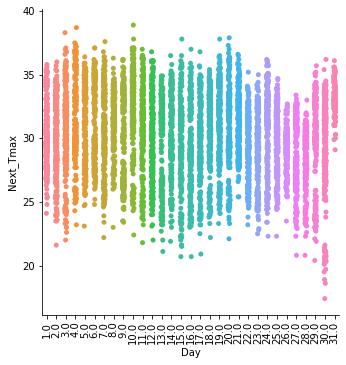

In [22]:
plt.figure(figsize=(12,8))
sns.catplot(x="Day",y='Next_Tmax',data=df)
plt.xticks(rotation=90)
plt.show()

In [23]:
df.groupby(['Day','year','Month']).mean()

station  Present_Tmax  Present_Tmin  LDAPS_RHmin  \
Day  year   Month                                                     
1.0  2013.0 7.0       13.0     30.712000     23.180000    68.044600   
            8.0       13.0     32.016000     24.056000    71.192945   
     2014.0 7.0       13.0     30.968000     21.164000    56.354590   
            8.0       13.0     33.952000     23.892000    46.836222   
     2015.0 7.0       13.0     27.256000     20.712000    30.742482   
...                    ...           ...           ...          ...   
31.0 2013.0 7.0       13.0     29.100000     24.348000    50.804661   
     2014.0 7.0       13.0     32.800000     25.084000    43.123421   
     2015.0 7.0       13.0     32.050728     25.869002    67.572385   
     2016.0 7.0       13.0     32.712000     25.948000    56.759372   
     2017.0 7.0       13.0     26.796000     23.984000    49.626836   

                   LDAPS_RHmax  LDAPS_Tmax_lapse  LDAPS_Tmin_lapse   LDAPS_WS  \
Day  year   Month                                                               
1.0  2013.0 7.0      92.795080         27.089192         22.596206  12.709159   
            8.0      90.100500         29.235333         25.537034   6.176806   
     2014.0 7.0      83.155032         28.932349         23.452906   6.702744   
            8.0      80.770775         34.734612         26.504395  11.574334   
     2015.0 7.0      90.135367         27.965768         19.982591   8.544906   
...                        ...               ...               ...        ...   
31.0 2013.0 7.0      85.882849         31.686908         24.514922   4.573816   
     2014.0 7.0      89.362540         34.359766         25.123424   5.970303   
     2015.0 7.0      88.844332         29.811906         25.793939   8.355298   
     2016.0 7.0      88.374804         29.613447         23.512589   7.097875   
     2017.0 7.0      89.051882         32.552243         23.692151   4.853839   

                     LDAPS_LH  LDAPS_CC1  LDAPS_CC2  LDAPS_CC3  LDAPS_CC4  \
Day  year   Month                                                           
1.0  2013.0 7.0     86.295042   0.599017   0.839490   0.749092   0.597873   
            8.0     47.741191   0.475641   0.775823   0.437737   0.224421   
     2014.0 7.0     52.284337   0.325953   0.324611   0.456995   0.637291   
            8.0    107.156646   0.425179   0.314403   0.338427   0.546806   
     2015.0 7.0     64.945853   0.048680   0.259989   0.051807   0.002076   
...                       ...        ...        ...        ...        ...   
31.0 2013.0 7.0     60.374213   0.214183   0.146123   0.170777   0.059084   
     2014.0 7.0     72.606887   0.371231   0.226610   0.250915   0.254137   
     2015.0 7.0     51.895604   0.715338   0.748933   0.303484   0.218627   
     2016.0 7.0     62.505019   0.368774   0.356080   0.318404   0.299191   
     2017.0 7.0     69.082556   0.444033   0.266899   0.038574   0.066226   

                   LDAPS_PPT1  LDAPS_PPT2  LDAPS_PPT3  LDAPS_PPT4       lat  \
Day  year   Month                                                             
1.0  2013.0 7.0      1.131495    8.244692    0.241116    2.347935  37.54472   
            8.0      0.000000    2.087565    0.124070    0.000000  37.54472   
     2014.0 7.0      0.002085    0.000000    0.009031    0.126916  37.54472   
            8.0      0.044797    0.000653    0.000000    0.483750  37.54472   
     2015.0 7.0      0.000000    0.388754    0.052756    0.000000  37.54472   
...                       ...         ...         ...         ...       ...   
31.0 2013.0 7.0      0.000000    0.000000    0.000000    0.000000  37.54472   
     2014.0 7.0      0.096748    0.000000    0.000000    0.000000  37.54472   
     2015.0 7.0      0.007683    0.018358    0.003929    0.000000  37.54472   
     2016.0 7.0      0.591995    0.485003    0.278200    0.269407  37.54472   
     2017.0 7.0      0.000000    0.000115    0.000000    0.000000  37.54472   

           

<Figure size 864x576 with 0 Axes>

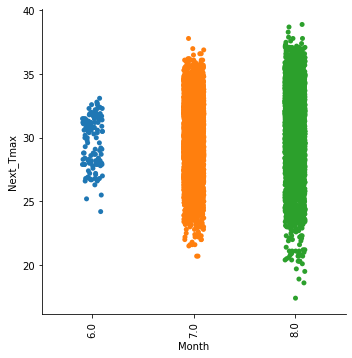

In [24]:
plt.figure(figsize=(12,8))
sns.catplot(x="Month",y='Next_Tmax',data=df)
plt.xticks(rotation=90)
plt.show()

<Figure size 864x576 with 0 Axes>

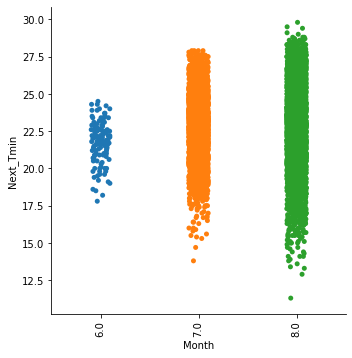

In [25]:
plt.figure(figsize=(12,8))
sns.catplot(x="Month",y='Next_Tmin',data=df)
plt.xticks(rotation=90)
plt.show()

<Figure size 864x576 with 0 Axes>

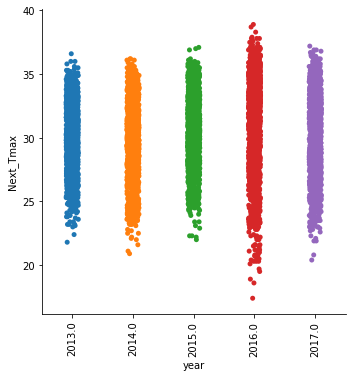

In [26]:
plt.figure(figsize=(12,8))
sns.catplot(x="year",y='Next_Tmax',data=df)
plt.xticks(rotation=90)
plt.show()

<Figure size 864x576 with 0 Axes>

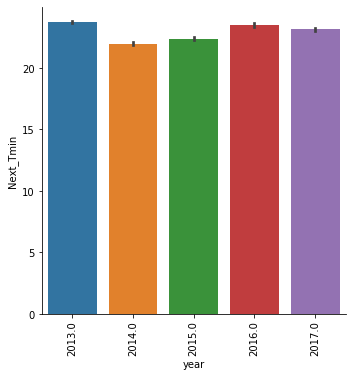

In [27]:
plt.figure(figsize=(12,8))
sns.catplot(x="year",y='Next_Tmin',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x576 with 0 Axes>

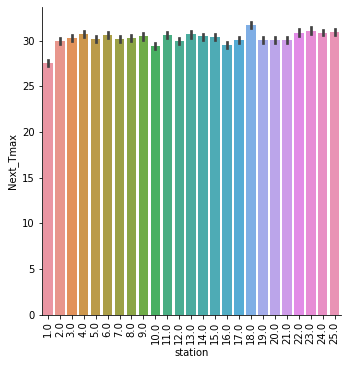

In [28]:
plt.figure(figsize=(12,8))
sns.catplot(x="station",y='Next_Tmax',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x576 with 0 Axes>

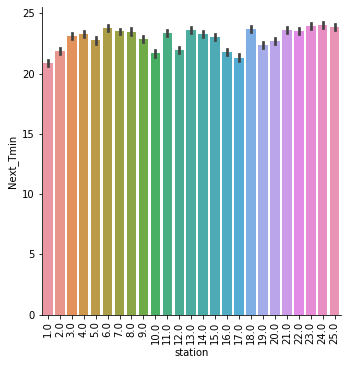

In [29]:
plt.figure(figsize=(12,8))
sns.catplot(x="station",y='Next_Tmin',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

<Figure size 864x576 with 0 Axes>

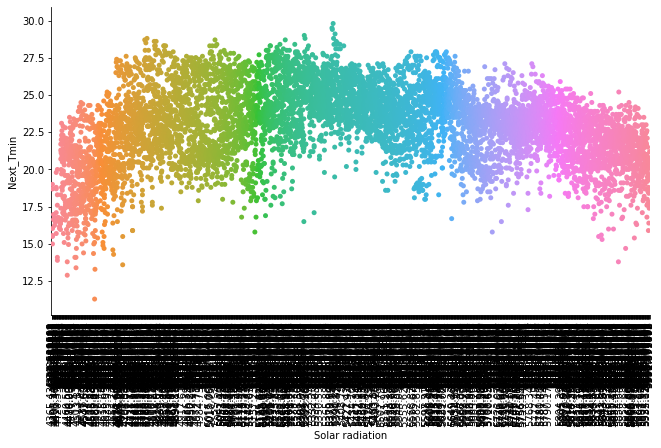

In [30]:
plt.figure(figsize=(12,8))
sns.catplot(x="Solar radiation",y='Next_Tmin',data=df,size=5,aspect=2)
plt.xticks(rotation=90)
plt.show()

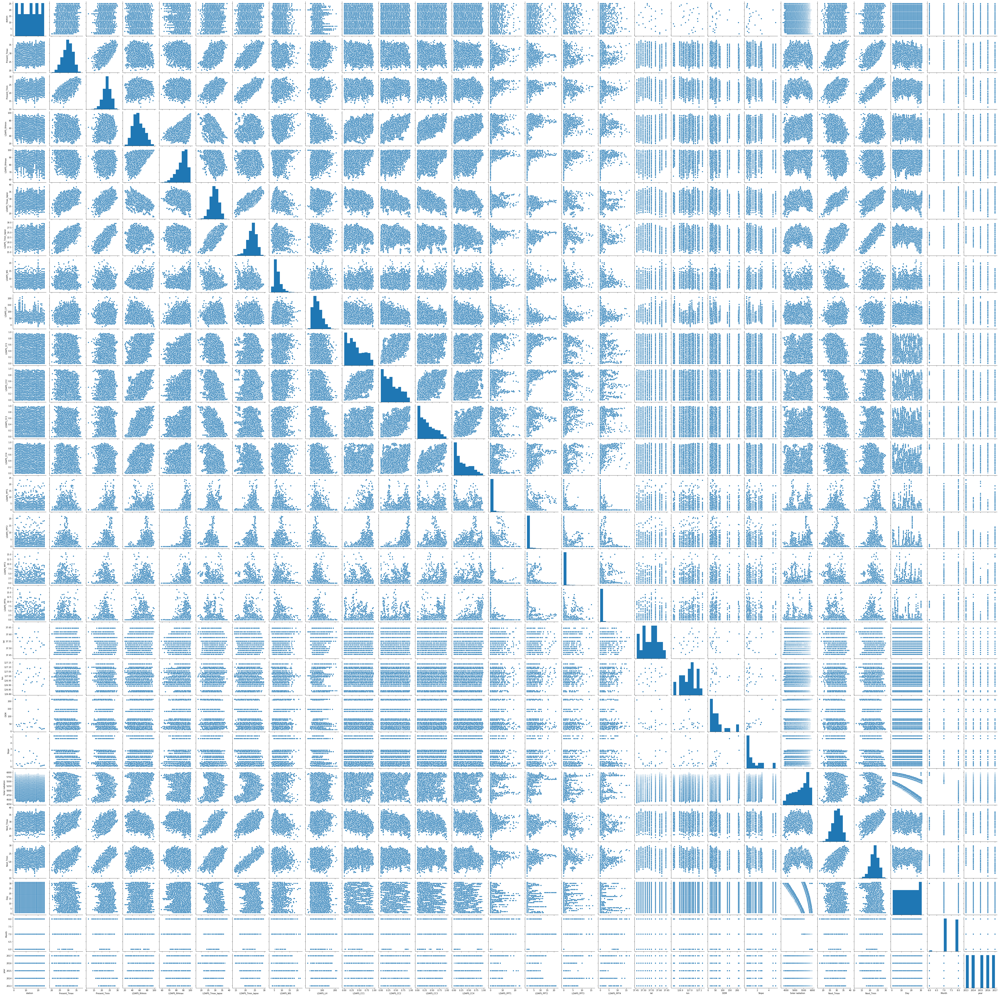

In [31]:
sns.pairplot(df)

In [32]:
df['Tmin']=df['Next_Tmin']
df.head(2)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,year,Tmin
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30.0,6.0,2013.0,21.2
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30.0,6.0,2013.0,22.5


In [33]:
df.drop("Next_Tmin",axis=1,inplace=True)

In [34]:
from scipy.stats import zscore
print("print shape before zscore",df.shape)
z=np.abs(zscore(df))
df=df[(z<3).all(axis=1)]
print("print shape after zscore",df.shape)

print shape before zscore (7750, 27)
print shape after zscore (6888, 27)


In [35]:
#Seperating x and y
x=df.iloc[:,0:-1]
y=pd.DataFrame(df.iloc[:,-1])
print(x.shape)
y.shape

(6888, 26)


(6888, 1)

In [36]:
# checking skewness of data
x.skew()

station             0.002824
Present_Tmax       -0.274048
Present_Tmin       -0.225739
LDAPS_RHmin         0.305363
LDAPS_RHmax        -0.687967
LDAPS_Tmax_lapse   -0.107947
LDAPS_Tmin_lapse   -0.382885
LDAPS_WS            1.088575
LDAPS_LH            0.569060
LDAPS_CC1           0.595343
LDAPS_CC2           0.501691
LDAPS_CC3           0.700518
LDAPS_CC4           0.711008
LDAPS_PPT1          3.723069
LDAPS_PPT2          4.859920
LDAPS_PPT3          5.479300
LDAPS_PPT4          5.926613
lat                 0.108039
lon                -0.275324
DEM                 1.765466
Slope               1.595105
Solar radiation    -0.505080
Next_Tmax          -0.268494
Day                 0.001171
Month              -0.193610
year                0.011207
dtype: float64

In [37]:
#using sqrt function to reduce skewness
for i in x.columns:
    if x.skew()[i]>0.55:
        x[i]=np.sqrt(x[i])

In [38]:
x.skew()

station             0.002824
Present_Tmax       -0.274048
Present_Tmin       -0.225739
LDAPS_RHmin         0.305363
LDAPS_RHmax        -0.687967
LDAPS_Tmax_lapse   -0.107947
LDAPS_Tmin_lapse   -0.382885
LDAPS_WS            0.734981
LDAPS_LH           -0.004968
LDAPS_CC1          -0.174941
LDAPS_CC2           0.501691
LDAPS_CC3          -0.102498
LDAPS_CC4           0.003371
LDAPS_PPT1          2.396424
LDAPS_PPT2          3.031074
LDAPS_PPT3          3.254610
LDAPS_PPT4          3.592047
lat                 0.108039
lon                -0.275324
DEM                 1.174340
Slope               0.883783
Solar radiation    -0.505080
Next_Tmax          -0.268494
Day                 0.001171
Month              -0.193610
year                0.011207
dtype: float64

In [39]:
x.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            1
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Day                 0
Month               0
year                0
dtype: int64

In [40]:
x.dropna(axis=1,inplace=True)

In [41]:
x.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Day                 0
Month               0
year                0
dtype: int64

In [42]:
#as the skewness needs to be reduced again, we use log function to reduce
for i in x.columns:
    if x.skew()[i]>0.55:
        x[i]=np.log1p(x[i])

In [43]:
x.skew()

station             0.002824
Present_Tmax       -0.274048
Present_Tmin       -0.225739
LDAPS_RHmin         0.305363
LDAPS_RHmax        -0.687967
LDAPS_Tmax_lapse   -0.107947
LDAPS_Tmin_lapse   -0.382885
LDAPS_WS            0.477470
LDAPS_CC1          -0.174941
LDAPS_CC2           0.501691
LDAPS_CC3          -0.102498
LDAPS_CC4           0.003371
LDAPS_PPT1          1.949093
LDAPS_PPT2          2.386907
LDAPS_PPT3          2.649776
LDAPS_PPT4          2.973804
lat                 0.108039
lon                -0.275324
DEM                 0.515345
Slope               0.498994
Solar radiation    -0.505080
Next_Tmax          -0.268494
Day                 0.001171
Month              -0.193610
year                0.011207
dtype: float64

In [44]:
# Applying Standard Scaler
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=scaler.fit_transform(x)
x=pd.DataFrame(x)
x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,-1.671640,-0.434229,-0.828313,0.192637,0.437422,-0.663279,-0.291150,0.086745,-0.236411,-0.532440,-0.376235,-0.428167,-0.523948,-0.470577,-0.443511,-0.393349,1.215021,0.002447,2.127595,1.304742,1.552140,-0.500481,1.580411,-2.799117,-1.42333
1,-1.532756,0.687209,-0.741633,-0.241178,0.363364,-0.013229,0.172937,-0.619617,-0.274050,-0.332489,-0.388320,-0.446464,-0.523948,-0.470577,-0.443511,-0.393349,1.215021,0.516937,-0.040990,-0.395048,1.257982,-0.022667,1.580411,-2.799117,-1.42333
2,-1.393873,0.582074,-0.004851,-0.499842,-0.596469,0.074807,0.412468,-0.326659,-0.348164,-0.308691,-0.162776,-0.365862,-0.523948,-0.470577,-0.443511,-0.393349,0.674208,0.843199,-0.432312,-0.875272,1.244279,0.182110,1.580411,-2.799117,-1.42333
3,-1.254990,0.722254,0.038489,0.191486,1.214323,-0.066672,-0.147040,-0.648075,-0.315600,-0.440112,-0.379121,-0.409422,-0.523948,-0.470577,-0.443511,-0.393349,2.024238,0.391451,-0.012784,1.192323,1.228591,0.386887,1.580411,-2.799117,-1.42333
4,-1.116107,0.511985,-0.611613,0.041939,0.298287,-0.282806,-0.074677,-0.590479,-0.640712,-0.339906,-0.286631,-0.220569,-0.523948,-0.470577,-0.443511,-0.393349,0.135398,1.809436,-0.365809,-0.408590,1.234750,0.216239,1.580411,-2.799117,-1.42333


# Calculating best r_state for train_test_split

In [45]:
#importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [46]:
def maxr2_score(regr,x,y):
    max_r2_score=0
    for r_state in range(42,100):
        train_x,test_x,train_y,test_y=train_test_split(x,y,random_state=r_state,test_size=0.20)
        regr.fit(train_x,train_y)
        pred=regr.predict(test_x)
        r2score=r2_score(test_y,pred)
        print("The r2 score at r state", r_state, "is", r2score )
        if r2score>max_r2_score:
            max_r2_score=r2score
            final_r_state=r_state
    print("The max r2 score", max_r2_score, "is achieved at r_state", final_r_state)

In [47]:
lr=LinearRegression()
maxr2_score(lr,x,y)

The r2 score at r state 42 is 0.834818387420534
The r2 score at r state 43 is 0.8329311742013523
The r2 score at r state 44 is 0.8356124907264786
The r2 score at r state 45 is 0.8519961805939912
The r2 score at r state 46 is 0.8428348750407898
The r2 score at r state 47 is 0.8399204304204435
The r2 score at r state 48 is 0.8412614160554118
The r2 score at r state 49 is 0.8412304545081117
The r2 score at r state 50 is 0.8330180782104456
The r2 score at r state 51 is 0.8320086306879977
The r2 score at r state 52 is 0.8411395941058993
The r2 score at r state 53 is 0.830748935267267
The r2 score at r state 54 is 0.8360181991266351
The r2 score at r state 55 is 0.8382065731582908
The r2 score at r state 56 is 0.8287899756637415
The r2 score at r state 57 is 0.8399436281848944
The r2 score at r state 58 is 0.8409648954494047
The r2 score at r state 59 is 0.832383811043437
The r2 score at r state 60 is 0.8312164905608671
The r2 score at r state 61 is 0.8309401699276494
The r2 score at r state

In [48]:
#Lets finalise the train and test data
train_x,test_x,train_y,test_y=train_test_split(x,y,random_state=45,test_size=0.20)
print(train_x.shape)
print(train_y.shape)
print(test_x.shape)
print(test_y.shape)

(5510, 25)
(5510, 1)
(1378, 25)
(1378, 1)


In [49]:
#Let use Linear Regression and check max r2 score corresponding to different random states
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
r_state=maxr2_score(lr,x,y)

The r2 score at r state 42 is 0.834818387420534
The r2 score at r state 43 is 0.8329311742013523
The r2 score at r state 44 is 0.8356124907264786
The r2 score at r state 45 is 0.8519961805939912
The r2 score at r state 46 is 0.8428348750407898
The r2 score at r state 47 is 0.8399204304204435
The r2 score at r state 48 is 0.8412614160554118
The r2 score at r state 49 is 0.8412304545081117
The r2 score at r state 50 is 0.8330180782104456
The r2 score at r state 51 is 0.8320086306879977
The r2 score at r state 52 is 0.8411395941058993
The r2 score at r state 53 is 0.830748935267267
The r2 score at r state 54 is 0.8360181991266351
The r2 score at r state 55 is 0.8382065731582908
The r2 score at r state 56 is 0.8287899756637415
The r2 score at r state 57 is 0.8399436281848944
The r2 score at r state 58 is 0.8409648954494047
The r2 score at r state 59 is 0.832383811043437
The r2 score at r state 60 is 0.8312164905608671
The r2 score at r state 61 is 0.8309401699276494
The r2 score at r state

In [50]:
#Importing necessary libraries
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score


In [51]:
#Checking gridsearch for different algorithms
sr=SVR()
parameters={'kernel':('linear','rbf'), 'C':[1,10]}
gdsr=GridSearchCV(sr,parameters)
gdsr.fit(train_x,train_y)
gdsr.best_params_

{'C': 10, 'kernel': 'rbf'}

In [52]:
knn=KNeighborsRegressor()
parameters={'n_neighbors':(1,10)}
gdk=GridSearchCV(knn,parameters)
gdk.fit(train_x,train_y)
gdk.best_params_

{'n_neighbors': 10}

In [53]:

score=[]
cv=[]
MSE=[]
RMSE=[]
MAE=[]


algorithm=[LinearRegression(),SVR(C= 10, kernel= 'rbf'),DecisionTreeRegressor(),KNeighborsRegressor(n_neighbors=10)]
for i in algorithm:
    l=i
    print(l)
    l.fit(train_x,train_y)
    pred=l.predict(test_x)
    r2score=r2_score(test_y,pred)
    print("R2 score", r2score)
    score.append(r2score)
    crossscore=cross_val_score(l,x,y,cv=5,scoring='r2').mean()
    print("The CV Score is", crossscore)
    cv.append(crossscore)
    mean_sqrd_error=mean_squared_error(test_y,pred)
    MSE.append(mean_sqrd_error)
    print("Mean Squared Error is", mean_sqrd_error )
    rootMSE=np.sqrt(mean_sqrd_error)
    RMSE.append(rootMSE)
    print("Root Mean Squared Error is: ",rootMSE)
    Meanabserror=mean_absolute_error(test_y,pred)
    MAE.append(Meanabserror)
    print("Mean Absolute Error is: ", Meanabserror)
    print("\n")

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
R2 score 0.8519961805939912
The CV Score is 0.7851526302346193
Mean Squared Error is 0.8729273071995668
Root Mean Squared Error is:  0.934305788914725
Mean Absolute Error is:  0.7427559101071595


SVR(C=10, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
R2 score 0.9529991799660127
The CV Score is 0.7103949451040956
Mean Squared Error is 0.27721108436999087
Root Mean Squared Error is:  0.5265083896482475
Mean Absolute Error is:  0.39613854634104456


DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_sta

In [54]:
result=pd.DataFrame({'Model':['LinearRegression','SVR','DecisionTreeRegressor','KNeighborsRegressor'],'R2score':score,'Cross_val_score':cv,'Mean Squared Error':MSE, 'Root Mean Squared Error': RMSE, 'Mean Absolute Error':MAE})
result

,Model,R2score,Cross_val_score,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error
0,LinearRegression,0.851996,0.785153,0.872927,0.934306,0.742756
1,SVR,0.952999,0.710395,0.277211,0.526508,0.396139
2,DecisionTreeRegressor,0.812516,0.569193,1.105782,1.051562,0.770275
3,KNeighborsRegressor,0.892552,0.594007,0.633728,0.796070,0.612687


In [55]:
from sklearn.linear_model import Lasso
lsreg=Lasso()
parameters={"alpha":[0.001,0.01,0.1,1]}
clf=GridSearchCV(lsreg,parameters,cv=10)
clf.fit(x,y)
clf.best_params_

{'alpha': 0.01}

In [56]:
#Lets check max r2 score when to use
lsreg=Lasso(alpha=0.01)
r_state=maxr2_score(lsreg,x,y)

The r2 score at r state 42 is 0.8337532479925178
The r2 score at r state 43 is 0.826996580688995
The r2 score at r state 44 is 0.8318321264655968
The r2 score at r state 45 is 0.8483634453648858
The r2 score at r state 46 is 0.8392084020244217
The r2 score at r state 47 is 0.8364117802203362
The r2 score at r state 48 is 0.8388831378733788
The r2 score at r state 49 is 0.8381018948860351
The r2 score at r state 50 is 0.8310052780592225
The r2 score at r state 51 is 0.8297825857267103
The r2 score at r state 52 is 0.8375923980805116
The r2 score at r state 53 is 0.82763917269239
The r2 score at r state 54 is 0.8307274414189106
The r2 score at r state 55 is 0.8334885032787789
The r2 score at r state 56 is 0.8257399542001449
The r2 score at r state 57 is 0.8349592135788992
The r2 score at r state 58 is 0.8382176009865803
The r2 score at r state 59 is 0.8292455643525815
The r2 score at r state 60 is 0.828021624697762
The r2 score at r state 61 is 0.8281606233991694
The r2 score at r state 

In [57]:
#Lets use cross val score with Lasso
print("Mean r2 score for Lasso Regression:", cross_val_score(lsreg,x,y,cv=5,scoring='r2').mean())
print("standard deviation in r2 score for Lasso Regression: ", cross_val_score(lsreg,x,y,cv=5,scoring='r2').std())


Mean r2 score for Lasso Regression: 0.786297462233967
standard deviation in r2 score for Lasso Regression:  0.06884288186151268


In [58]:
#for getting best parameters we need to use grid search
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()
parameters={"learning_rate":[0.001,0.01,0.1,1],"n_estimators":[10,100,500,1000]}
clf=GridSearchCV(gbr,parameters,cv=5)
clf.fit(x,y)
clf.best_params_

{'learning_rate': 0.01, 'n_estimators': 1000}

In [59]:
#Now we will use cross val score to check the mean r2 score and standard deviation
gbr=GradientBoostingRegressor(learning_rate=0.01,n_estimators=1000)
print("Mean r2 score for Gradient boosting Regression:", cross_val_score(gbr,x,y,cv=5,scoring='r2').mean())
print("standard deviation in r2 score for Gradient boosting Regression: ", cross_val_score(gbr,x,y,cv=5,scoring='r2').std())

Mean r2 score for Gradient boosting Regression: 0.7957325650521034
standard deviation in r2 score for Gradient boosting Regression:  0.071759725551883


In [60]:
# Lets check the maximum r2 score corresponding to this
r_state=maxr2_score(gbr,x,y)

The r2 score at r state 42 is 0.8874332480538671
The r2 score at r state 43 is 0.8834775223654884
The r2 score at r state 44 is 0.8851090931152583
The r2 score at r state 45 is 0.897512338621126
The r2 score at r state 46 is 0.8918359459781823
The r2 score at r state 47 is 0.887328545967011
The r2 score at r state 48 is 0.8913545080335237
The r2 score at r state 49 is 0.8938410209484284
The r2 score at r state 50 is 0.8856146646003049
The r2 score at r state 51 is 0.887492432541543
The r2 score at r state 52 is 0.8886165938414273
The r2 score at r state 53 is 0.8785386163703734
The r2 score at r state 54 is 0.8823138075642448
The r2 score at r state 55 is 0.8873483173530108
The r2 score at r state 56 is 0.8801357092382128
The r2 score at r state 57 is 0.8904727126329784
The r2 score at r state 58 is 0.8925076754154871
The r2 score at r state 59 is 0.884870020707118
The r2 score at r state 60 is 0.8826220294588577
The r2 score at r state 61 is 0.8792333890915766
The r2 score at r state 

In [61]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
r_state=maxr2_score(rf,x,y)

The r2 score at r state 42 is 0.9036735695786424
The r2 score at r state 43 is 0.9013220403207262
The r2 score at r state 44 is 0.9018966466794104
The r2 score at r state 45 is 0.9177426375044031
The r2 score at r state 46 is 0.90787741458325
The r2 score at r state 47 is 0.9073806580016066
The r2 score at r state 48 is 0.9088271891054766
The r2 score at r state 49 is 0.9076881489343018
The r2 score at r state 50 is 0.9070776753295423
The r2 score at r state 51 is 0.9048994305841006
The r2 score at r state 52 is 0.9089899736625717
The r2 score at r state 53 is 0.898130775525563
The r2 score at r state 54 is 0.8999323467010222
The r2 score at r state 55 is 0.9051264251973732
The r2 score at r state 56 is 0.903004020998964
The r2 score at r state 57 is 0.9093838102079393
The r2 score at r state 58 is 0.9126282353909109
The r2 score at r state 59 is 0.9027919515594344
The r2 score at r state 60 is 0.9011150343742381
The r2 score at r state 61 is 0.8997263821060427
The r2 score at r state 

In [62]:
# After trying all above models RandomForestRegressor show best accuracy among all.. So lets finalize this model
rf=RandomForestRegressor(n_estimators=200,random_state=45)

In [ ]:
rf=RandomForestRegressor(n_estimators=200,random_state=45)
print("Mean r2 score for RandomForestRegressor:", cross_val_score(rf,x,y,cv=5,scoring='r2').mean())
print("standard deviation in r2 score for RandomForestRegressor: ", cross_val_score(rf,x,y,cv=5,scoring='r2').std())

Mean r2 score for RandomForestRegressor: 0.7862117833708353


In [ ]:
rf.fit(train_x,train_y)

In [ ]:
rf.score(train_x,train_y)

In [ ]:
rf.score(test_x,test_y)

In [ ]:
pred=rf.predict(test_x)

In [ ]:
pred

In [ ]:
print("RMSE is :",np.sqrt(mean_squared_error(test_y,pred)))
print("r2 score is :",r2_score(test_y,pred))

In [ ]:
# Saving The Model
from sklearn.externals import joblib
joblib.dump(rf,"rf_Temperature_Dataset.pkl")